In [1]:
#|default_exp 3c1_graph_construction_experiments
#|hide
## Standard libraries
import os
import math
import numpy as np
import time
# Configure environment
os.environ['XLA_PYTHON_CLIENT_PREALLOCATE']='false' # Tells Jax not to hog all of the memory to this process.

## Imports for plotting
import matplotlib.pyplot as plt
%matplotlib inline
from matplotlib.colors import to_rgba
import seaborn as sns
sns.set()

## Progress bar
from tqdm.notebook import tqdm, trange

## project specifics
import diffusion_curvature
from diffusion_curvature.datasets import *
from diffusion_curvature.graphs import *
from diffusion_curvature.core import *
from diffusion_curvature.utils import *
import jax
import jax.numpy as jnp
print(jax.devices())

%load_ext autoreload
%autoreload 2

[cuda(id=0)]


# 3e1 Flattening with Diffusion Models

# Examining the impact of noising on diffusion probabilities

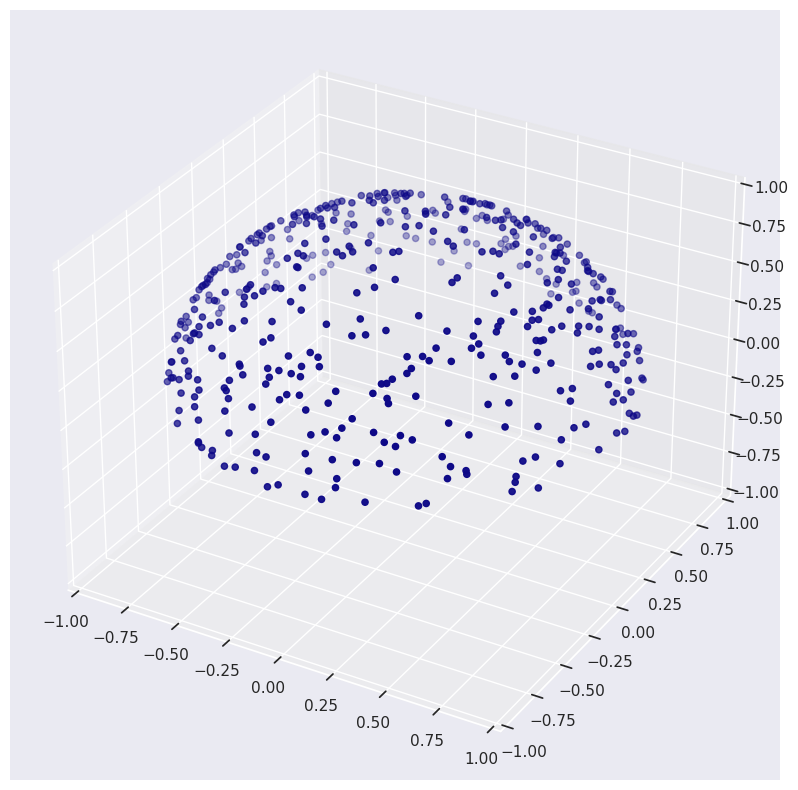

In [2]:
X_sphere, ks_sphere = sphere(1000,use_guide_points=True) # keep it relatively sparse
X_cap_of_sphere = X_sphere[X_sphere[:,2] > 0] # Just the itty bitty polar top
X_pca = X_cap_of_sphere[:,:2]
plot_3d(X_cap_of_sphere)

In [ ]:
from matplotlib.animation import FuncAnimation
from IPython.display import HTML

In [3]:
Lambda = 2  # @param {type:"slider", min:1, max:50, step:1}
timesteps = 50
ts = np.linspace(0, 1, timesteps)
# Generate random normal samples for the Wiener process
# dw = np.concatenate([np.zeros((len(ts),2,1)), np.random.normal(0, np.sqrt(ts[1] - ts[0]), size=(len(ts), 2, len(X_pca)-1))],axis=-1)  # Three-dimensional array for multiple trajectories
dw = np.concatenate([np.ones((len(ts),2,1)), 2*np.random.rand(len(ts), 2, len(X_pca)-1)],axis=-1)-1 # Three-dimensional array for multiple trajectories

In [4]:
# Compute the diffusion process for multiple trajectories
x = np.cumsum((Lambda**ts - 1)[:, None, None] * dw, axis=0) + X_pca.T[None, :, :]  # Broadcasting x0 to match the shape of dw

In [5]:
i = 4
print(x[i][0][0],x[i][1][0])

0.0 0.0


We'll now run diffusion at each point along the way, capturing the (unsigned) diffusion curvatures.

In [6]:
Ps_at_ts = []
uks_at_ts = []
for t in range(timesteps):
    G_t = get_adaptive_graph(x[t].T)
    DC = DiffusionCurvature(
        laziness_method="Wasserstein",
        graph_former = get_adaptive_graph,
    )
    uks = DC.unsigned_curvature(G_t, t=10)
    Ps_at_ts.append(DC.Pt)
    uks_at_ts.append(uks[0])

Text(0.5, 1.0, 'PCA Projection of Sphere Neighborhood')

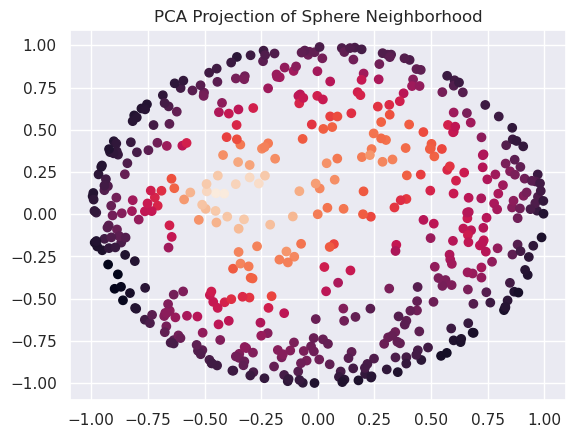

In [7]:
plt.scatter(X_pca[:,0],X_pca[:,1],c=Ps_at_ts[0][0])
plt.title("PCA Projection of Sphere Neighborhood")

In [ ]:
import matplotlib.pyplot as plt
import matplotlib.animation as animation
import numpy as np

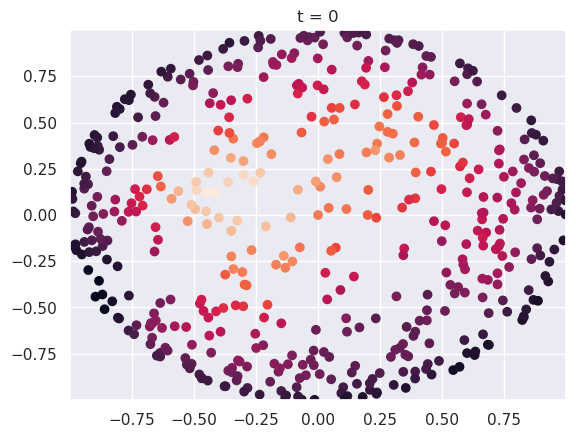

In [8]:
# Assuming x is a numpy array of shape (50, 2, 164)
# Set up the figure and axis for the animation
fig, ax = plt.subplots()

def animate(i):
    ax.clear()
    ax.scatter(x[i, 0, :], x[i, 1, :], c = Ps_at_ts[i][0])
    max = np.max(np.abs(x[i]))
    ax.set_xlim(-max, max)
    ax.set_ylim(-max, max)
    ax.set_title(f"t = {i}")

# Create the animation
ani = animation.FuncAnimation(fig, animate, frames=50, interval=400)
from IPython.display import HTML
HTML(ani.to_jshtml())

We'll compare the diffusion entropies of this diffusion process with the entropy of diffusion on the sphere, and on plane.

In [9]:
G_sphere = get_adaptive_graph(X_cap_of_sphere)
DC = DiffusionCurvature(
    laziness_method="Wasserstein",
    flattening_method="Fixed",
    comparison_method="Subtraction",
    graph_former = get_adaptive_graph,
)
sphere_entropy = DC.unsigned_curvature(G_sphere, t=10)[0]
sphere_entropy

Array(30.332912, dtype=float32)

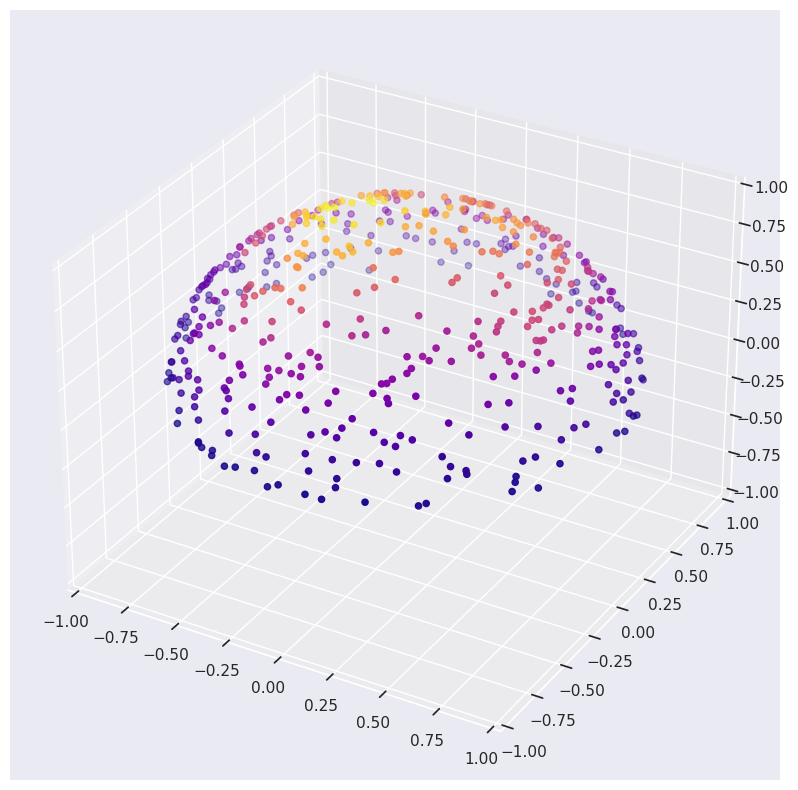

In [10]:
plot_3d(X_cap_of_sphere,DC.Pt[0])

In [11]:
DC.curvature(G_sphere,t=25,dim=2)[0]

Array(-11.218405, dtype=float32)

In [12]:
X_plane = plane(len(X_cap_of_sphere))
G_plane = get_adaptive_graph(X_plane)
plane_entropy = DC.unsigned_curvature(G_plane, t=10)[0]
plane_entropy

Array(33.120407, dtype=float32)

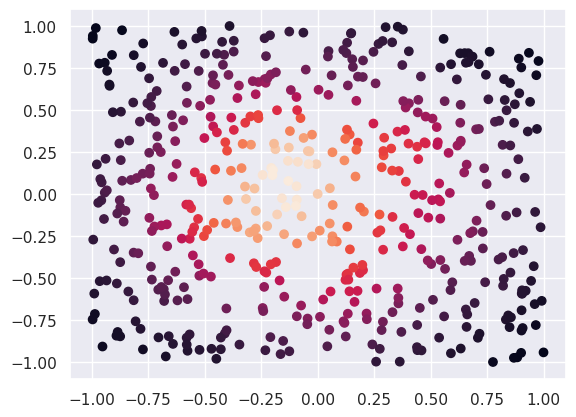

In [13]:
plt.scatter(X_plane[:,0], X_plane[:,1], c=DC.Pt[0])

In [14]:
# from diffusion_curvature.compute_mean_flat_entropies import average_flat_entropies
# plane_entropy = average_flat_entropies(dim=2,t=10,num_trials=100, num_points_in_comparison=len(X_pca))

In [15]:
plane_entropy

Array(33.120407, dtype=float32)

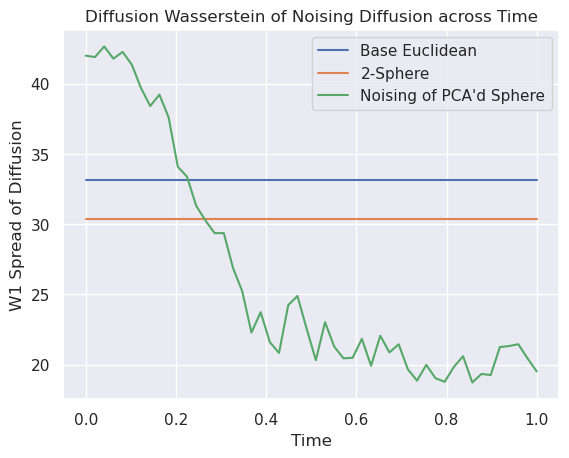

In [16]:
plt.plot(ts, np.ones_like(uks_at_ts)*plane_entropy, label = "Base Euclidean")
plt.plot(ts, np.ones_like(uks_at_ts)*sphere_entropy, label = "2-Sphere")
plt.plot(ts, uks_at_ts, label = "Noising of PCA'd Sphere")
plt.xlabel("Time")
plt.ylabel("W1 Spread of Diffusion")
plt.title("Diffusion Wasserstein of Noising Diffusion across Time")
plt.legend()
plt.show()

## With a Saddle

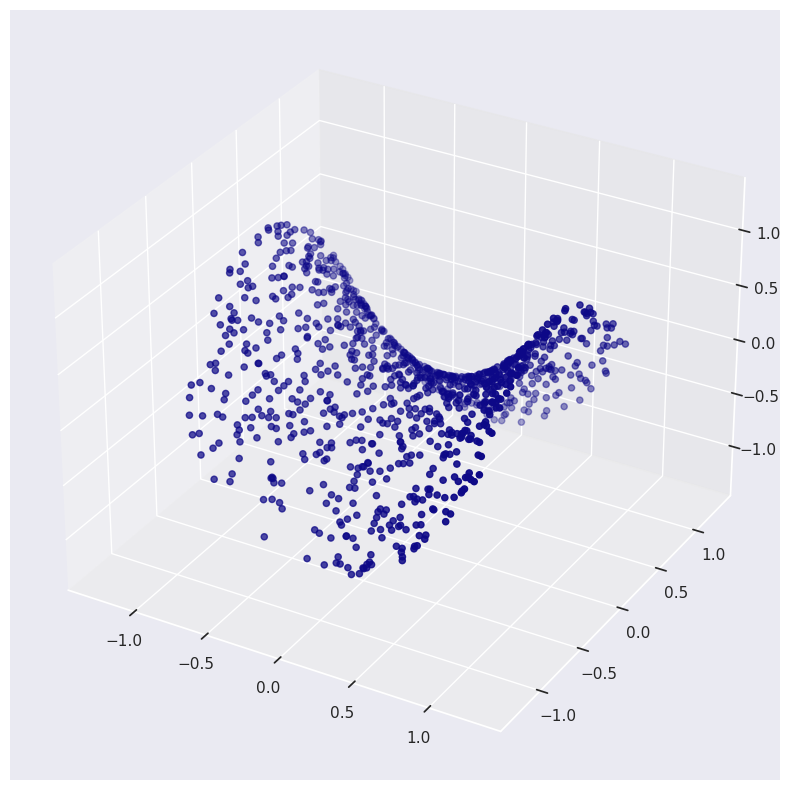

In [88]:
X_sphere, ks_sphere = paraboloid(1000,use_guide_points=True) # keep it relatively sparse
X_cap_of_sphere = X_sphere[X_sphere[:,2] > -1] # Just the itty bitty polar top
X_pca = X_cap_of_sphere[:,:2]
plot_3d(X_cap_of_sphere)

In [ ]:
from matplotlib.animation import FuncAnimation
from IPython.display import HTML


In [24]:

Lambda = 2  # @param {type:"slider", min:1, max:50, step:1}
timesteps = 50
ts = np.linspace(0, 1, timesteps)
# Generate random normal samples for the Wiener process
# dw = np.concatenate([np.zeros((len(ts),2,1)), np.random.normal(0, np.sqrt(ts[1] - ts[0]), size=(len(ts), 2, len(X_pca)-1))],axis=-1)  # Three-dimensional array for multiple trajectories
dw = np.concatenate([np.ones((len(ts),2,1)), 2*np.random.rand(len(ts), 2, len(X_pca)-1)],axis=-1)-1 # Three-dimensional array for multiple trajectories

In [25]:
# Compute the diffusion process for multiple trajectories
x = np.cumsum((Lambda**ts - 1)[:, None, None] * dw, axis=0) + X_pca.T[None, :, :]  # Broadcasting x0 to match the shape of dw

In [26]:
i = 4
print(x[i][0][0],x[i][1][0])

0.0 0.0


We'll now run diffusion at each point along the way, capturing the (unsigned) diffusion curvatures.

In [27]:
Ps_at_ts = []
uks_at_ts = []
for t in range(timesteps):
    G_t = get_adaptive_graph(x[t].T)
    DC = DiffusionCurvature(
        laziness_method="Wasserstein",
        graph_former = get_adaptive_graph,
    )
    uks = DC.unsigned_curvature(G_t, t=10)
    Ps_at_ts.append(DC.Pt)
    uks_at_ts.append(uks[0])

Text(0.5, 1.0, 'PCA Projection of Sphere Neighborhood')

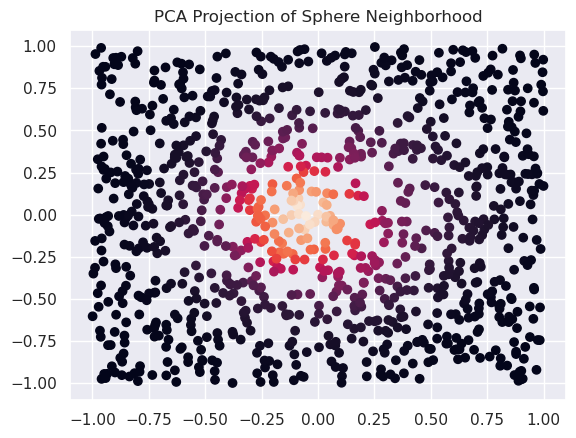

In [28]:
plt.scatter(X_pca[:,0],X_pca[:,1],c=Ps_at_ts[0][0])
plt.title("PCA Projection of Sphere Neighborhood")

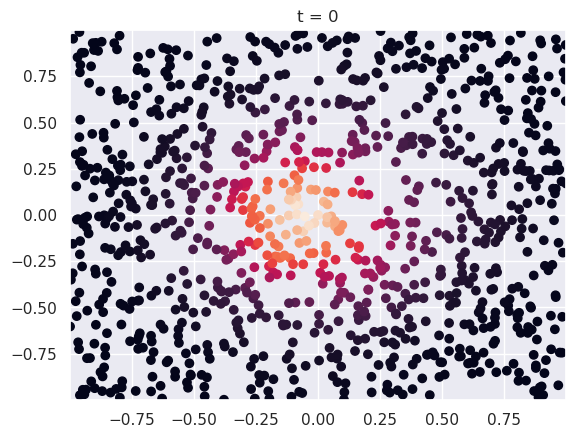

In [29]:
# Assuming x is a numpy array of shape (50, 2, 164)
# Set up the figure and axis for the animation
fig, ax = plt.subplots()

def animate(i):
    ax.clear()
    ax.scatter(x[i, 0, :], x[i, 1, :], c = Ps_at_ts[i][0])
    max = np.max(np.abs(x[i]))
    ax.set_xlim(-max, max)
    ax.set_ylim(-max, max)
    ax.set_title(f"t = {i}")

# Create the animation
ani = animation.FuncAnimation(fig, animate, frames=50, interval=400)
from IPython.display import HTML
HTML(ani.to_jshtml())

We'll compare the diffusion entropies of this diffusion process with the entropy of diffusion on the sphere, and on plane.

In [99]:
G_sphere = get_adaptive_graph(X_cap_of_sphere, k=15)
DC = DiffusionCurvature(
    laziness_method="Wasserstein",
    flattening_method="Fixed",
    comparison_method="Subtraction",
    graph_former = get_adaptive_graph,
)
sphere_entropy = DC.unsigned_curvature(G_sphere, t=25)[0]
sphere_entropy

Array(25.005825, dtype=float32)

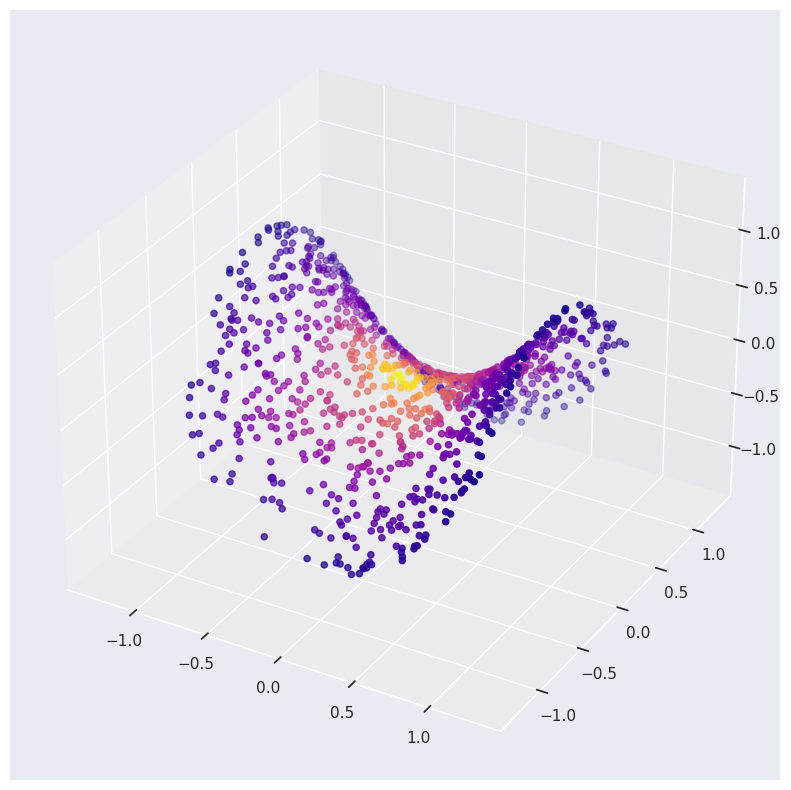

In [90]:
plot_3d(X_cap_of_sphere,DC.Pt[0])

In [91]:
DC.curvature(G_sphere,t=25,dim=2)[0]

Array(-35.839073, dtype=float32)

In [100]:
X_plane = plane(len(X_cap_of_sphere), dim=2)
G_plane = get_adaptive_graph(X_plane,k=15)
DC = DiffusionCurvature(
    laziness_method="Wasserstein",
    flattening_method="Fixed",
    comparison_method="Subtraction",
    graph_former = get_adaptive_graph,
)
plane_entropy = DC.unsigned_curvature(G_plane, t=25)[0]
plane_entropy

Array(28.964823, dtype=float32)

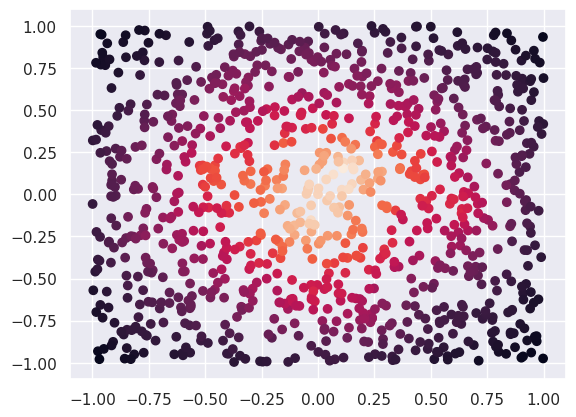

In [93]:
plt.scatter(X_plane[:,0], X_plane[:,1], c=DC.Pt[0])

In [83]:
# from diffusion_curvature.compute_mean_flat_entropies import average_flat_entropies
# plane_entropy = average_flat_entropies(dim=2,t=10,num_trials=100, num_points_in_comparison=len(X_pca))

In [84]:
plane_entropy

Array(40.152046, dtype=float32)

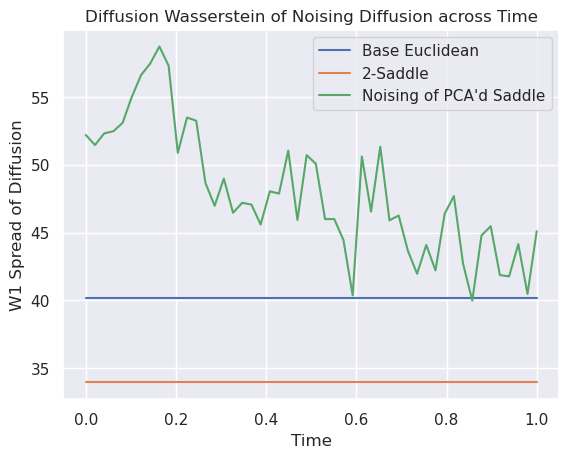

In [85]:
plt.plot(ts, np.ones_like(uks_at_ts)*plane_entropy, label = "Base Euclidean")
plt.plot(ts, np.ones_like(uks_at_ts)*sphere_entropy, label = "2-Saddle")
plt.plot(ts, uks_at_ts, label = "Noising of PCA'd Saddle")
plt.xlabel("Time")
plt.ylabel("W1 Spread of Diffusion")
plt.title("Diffusion Wasserstein of Noising Diffusion across Time")
plt.legend()
plt.show()